**Predicting the Classification of Pulsar Stars**
==========

Introduction
=====

Background
---

[INSERT HERE]


Question
---
[INSERT HERE]


In [1]:
# Loading libraries
library(tidyverse) # functions for our analysis
library(RColorBrewer) # color scheme
library(repr) # for visualization
library(tidymodels) # for our models
library(shiny) # for adding titles in tables
install.packages("kknn") # for our classification model

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.2     ✔ rsample      1.1.1
✔ dials        1.1.0     ✔ tune         1.0.1
✔ infer        1.0.4     ✔ workflows    1.1.2
✔ modeldata    1.0.1     ✔ workflowsets 1.0.0
✔ parsnip      1.0.3     ✔ yardstick    1.1.0
✔ recipes      1.0.4     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filter()   masks stats::filter()
✖ recipes::fixed()  masks stringr::fixed()
✖ dplyr::lag()      masks stats::lag()
✖ yardstick::spec() masks read

Dataset
----

The data set we will be using is called "Sonar Data" (doi: 10.24432/C5T01Q).  


Here is a short description of what each variable represents:
* mean_ip: the mean of the integrated profile
* sd_ip: standard deviation of the integrated profile
* kuritosis_ip : excess kurtosis of the integrated profile.
* skew_ip: skewness of the integrated profile.
* mean_dmsnr: mean of DM-SMR curve
* sd_dmsmr: standard deviation of the DM-SMR curve
* kurtosis_dmsnr: excess kurtosis of the DM-SNR curve
* skew_dmsnr: skewness of the DM-SNR curve 

[INSERT REFERENCE]

Explaining the code: We are reading the pulsar star dataset from a URL from GitHub. Because the dataset does not have column names, we are renaming the columns following the conventions from the dataset desecription. Also, we use the function mutate so the variable that we are trying to predict, pulsar, is a factor. Then, we visualize the first 6 entries and the last 6 entries of our dataset.

In [2]:
# Reading, renaming and mutating to factor format (pulsar), tidying
star_data <- read_csv("https://raw.githubusercontent.com/luigivicencio/dsci100-003-008/main/HTRU_2.csv", col_names = FALSE) |>
    rename("mean_ip" = X1, "sd_ip" = X2, "kurtosis_ip" = X3, 
           "skew_ip" = X4, "mean_dmsnr" = X5, "sd_dmsnr" = X6, 
           "kurtosis_dmsnr" = X7, "skew_dmsnr" = X8, "pulsar" = X9)|>
    mutate(pulsar = as_factor(pulsar)) |>
    mutate(pulsar = fct_recode(pulsar,"No" = "0", "Yes" = "1"))


h3("Table 1: First 6 entries of Pulsar Star dataset")
head(star_data)
h3("Table 2: Last 6 entries of Pulsar Star dataset")
tail(star_data)

Rows: 17898 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (9): X1, X2, X3, X4, X5, X6, X7, X8, X9

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Shiny tags cannot be represented in plain text (need html)

mean_ip,sd_ip,kurtosis_ip,skew_ip,mean_dmsnr,sd_dmsnr,kurtosis_dmsnr,skew_dmsnr,pulsar
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
140.56250,55.68378,-0.23457141,-0.6996484,3.199833,19.11043,7.975532,74.24222,No
102.50781,58.88243,0.46531815,-0.5150879,1.677258,14.86015,10.576487,127.39358,No
103.01562,39.34165,0.32332837,1.0511644,3.121237,21.74467,7.735822,63.17191,No
136.75000,57.17845,-0.06841464,-0.6362384,3.642977,20.95928,6.896499,53.59366,No
88.72656,40.67223,0.60086608,1.1234917,1.178930,11.46872,14.269573,252.56731,No
93.57031,46.69811,0.53190485,0.4167211,1.636288,14.54507,10.621748,131.39400,No


Shiny tags cannot be represented in plain text (need html)

mean_ip,sd_ip,kurtosis_ip,skew_ip,mean_dmsnr,sd_dmsnr,kurtosis_dmsnr,skew_dmsnr,pulsar
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
96.0000,44.19311,0.3886740,0.28134362,1.871237,15.83375,9.634927,104.821623,No
136.4297,59.84742,-0.1878456,-0.73812297,1.296823,12.16606,15.450260,285.931022,No
122.5547,49.48561,0.1279781,0.32306090,16.409699,44.62689,2.945244,8.297092,No
119.3359,59.93594,0.1593631,-0.74302540,21.430602,58.87200,2.499517,4.595173,No
114.5078,53.90240,0.2011614,-0.02478884,1.946488,13.38173,10.007967,134.238910,No
57.0625,85.79734,1.4063910,0.08951971,188.306020,64.71256,-1.597527,1.429475,No


In [3]:
## LEGEND

Methods & Results:
===

Pre-Analysis
-----

Explaining the code: We are splitting the dataset into two subdatasets (training and testing) with a proportion of 75% of training set. With the training set, we are centering and scaling our predictors variables for doing a summary table.

In [4]:
set.seed(1010)

#Splitting the dataset into training and testing subgroups (where 75% of the data will be used as the training set)
star_split <- initial_split(star_data, prop = 0.75, strata = pulsar)  
star_train <- training(star_split)   
star_test <- testing(star_split)

#Creating a recipe, scaling, centering, and baking
star_recipe1 <- recipe(pulsar ~ ., data = star_train) |>
    step_scale(all_predictors()) |>
    step_center(all_predictors()) |>
    prep()

scaled_star <- bake(star_recipe1, star_train)

# Creating a summary table
star_table <- group_by(scaled_star, pulsar) |>
    summarize(count = n(),
             missing_values = sum(is.na(scaled_star)), # check that
             mean_mean_ip = mean(mean_ip), # check that
             mean_sd_ip = mean(sd_ip),
             mean_skew_ip = mean(skew_ip),
             mean_kurtosis_ip = mean(kurtosis_ip),
             mean_mean_dmsnr = mean(mean_dmsnr),
             mean_sd_dmsnr = mean(sd_dmsnr),
             mean_skew_dmsnr = mean(skew_dmsnr),
             mean_kurtosis_dmsnr = mean(kurtosis_dmsnr))

h3("Table 3: Summary of training set")
star_table

Shiny tags cannot be represented in plain text (need html)

pulsar,count,missing_values,mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<fct>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
No,12199,0,0.2124711,0.1156343,-0.2238643,-0.2497242,-0.1257689,-0.1555325,0.08199895,0.1234337
Yes,1224,0,-2.1175940,-1.1524696,2.2311439,2.4888771,1.2534763,1.5501153,-0.81724280,-1.2302023


In [5]:
t1 <- star_table |>
    select(-count, -missing_values, -pulsar) |>
    tail(-1)

t2 <- star_table |>
    select(-count, -missing_values, -pulsar) |>
    head(-1)

abs(t1 - t2)

mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2.330065,1.268104,2.455008,2.738601,1.379245,1.705648,0.8992418,1.353636


In [6]:
### LEGEND

In [7]:
# HOW TO CALCULATE THE DIFFERENCE BETWEEN MAX AND MIN

star_table_analysis <- star_table |>
    select(mean_mean_ip:mean_kurtosis_dmsnr) |>
    map(max) |>
    as_tibble()
star_table_analysis

star_table_analysis_2 <- star_table |>
    select(mean_mean_ip:mean_kurtosis_dmsnr) |>
    map(min) |>
    as_tibble()
star_table_analysis_2

setdiff(star_table_analysis, star_table_analysis_2)


mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.2124711,0.1156343,2.231144,2.488877,1.253476,1.550115,0.08199895,0.1234337


mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
-2.117594,-1.15247,-0.2238643,-0.2497242,-0.1257689,-0.1555325,-0.8172428,-1.230202


mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.2124711,0.1156343,2.231144,2.488877,1.253476,1.550115,0.08199895,0.1234337


In [8]:
# LEGEND

In [9]:
# EXPLANATION OF WHY SKEW AND KURTOSIS. 
#Predictors are going to be the mean of the integrated profile, skewness of the integrated profile and excess kurtosis of the integrated profile. 
#We have two options of ways of measuring (integrated profile and DM-SNR curve), we choose to only use integrated profile. 
#Then we are not using the standard deviation (SD), because the difference between average of pulsar’s SD and average of not pulsar’s SD is not so significant. 
#hat is why we are just choosing mean, skewness and kurtosis.

Explaining the code: Using our scaled data from the training set, we are plotting a scatterplot of our two predictors: skewness of the integrated profile and excess kurtosis of the integrated profile. We apply a color scheme to label if the data point is a pulsar or not pulsar.

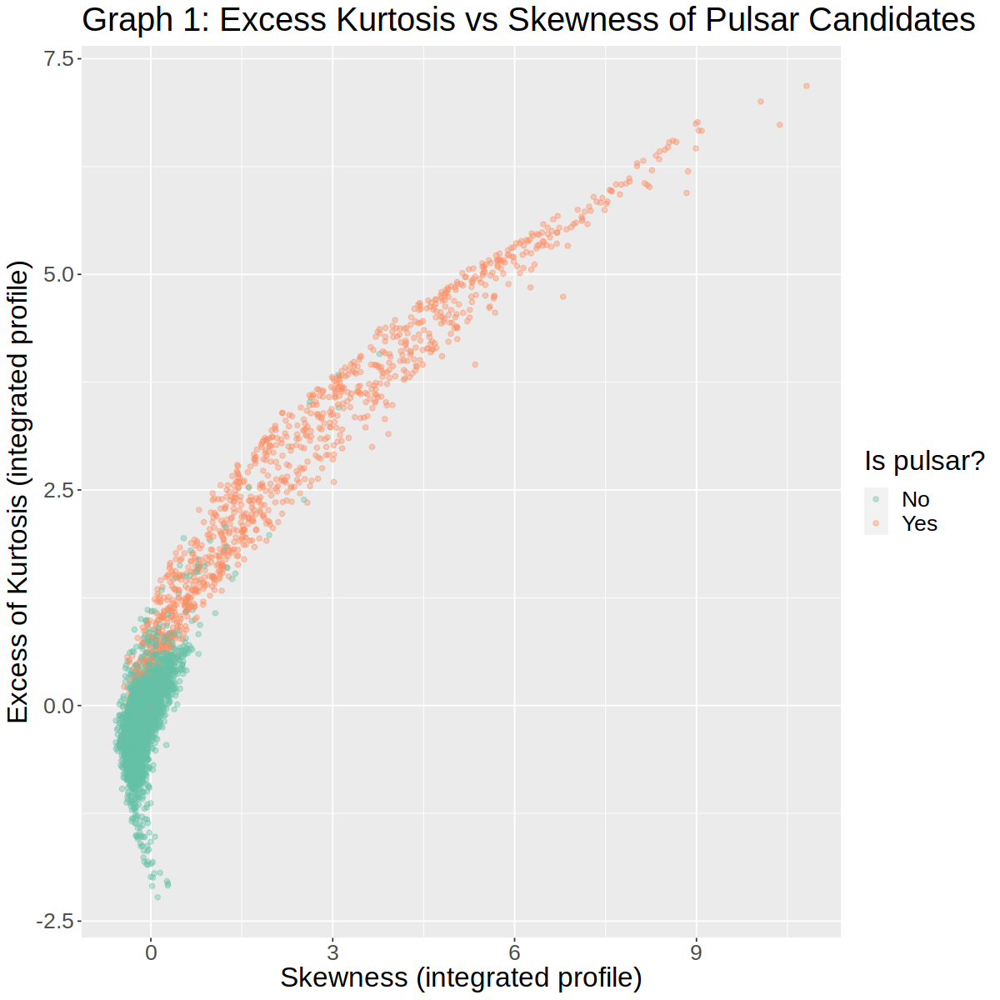

In [10]:
#Creating an initial plot to visualize the data
options(repr.plot.width = 10, repr.plot.height = 10)

star_plot_skew <- ggplot (scaled_star, aes(x = skew_ip, y = kurtosis_ip, color = pulsar)) +
                geom_point(alpha = 0.4) +
                labs(y = "Excess of Kurtosis (integrated profile)", x = "Skewness (integrated profile)", color = "Is pulsar?") + 
                ggtitle("Graph 1: Excess Kurtosis vs Skewness of Pulsar Candidates") +
                theme(text = element_text(size = 20)) + 
                scale_color_brewer(palette = "Set2")
star_plot_skew        

In [11]:
## LEGEND

Data Analysis
-----

In [12]:
## Explaining the code

NULL

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.9646874,5,0.002218082,Preprocessor1_Model01
2,accuracy,binary,0.9646874,5,0.002218082,Preprocessor1_Model02
3,accuracy,binary,0.9753408,5,0.001608468,Preprocessor1_Model03
4,accuracy,binary,0.9753408,5,0.001608468,Preprocessor1_Model04
5,accuracy,binary,0.9757879,5,0.001584711,Preprocessor1_Model05
6,accuracy,binary,0.9757879,5,0.001584711,Preprocessor1_Model06
7,accuracy,binary,0.9769054,5,0.001549237,Preprocessor1_Model07
8,accuracy,binary,0.9769054,5,0.001549237,Preprocessor1_Model08
9,accuracy,binary,0.9766074,5,0.001468295,Preprocessor1_Model09


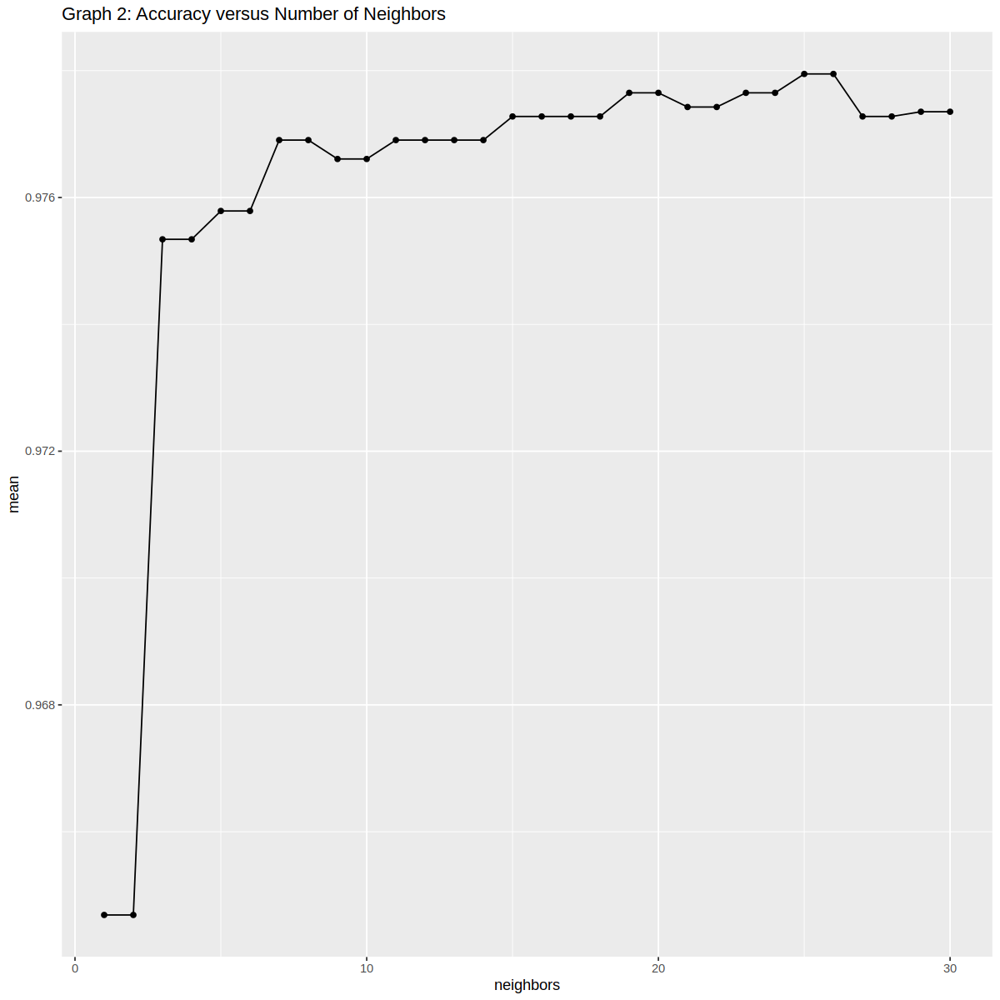

In [13]:
set.seed(1010)

# Parameter value selection

#Comment
knn_tune <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
       set_engine("kknn") |>
       set_mode("classification")

# Comment
star_recipe <- recipe(pulsar ~ kurtosis_ip + skew_ip, data = star_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

# Comment
star_vfold <- vfold_cv(star_train, v = 5, strata = pulsar)
k_vals <- tibble(neighbors = seq(from = 1, to = 30, by = 1))

# Comment
knn_results <- workflow() |>
    add_recipe(star_recipe) |>
    add_model(knn_tune) |>
    tune_grid(resamples = star_vfold, grid = k_vals) |>
    collect_metrics() |>
    filter(.metric == "accuracy")

# COMMENT
accuracy_versus_k <- ggplot(knn_results, aes(x = neighbors, y = mean))+
        geom_point() +
        geom_line() +
        ggtitle("Graph 2: Accuracy versus Number of Neighbors")
        labs(x = "Neighbors", y = "Accuracy Estimate") +
        scale_x_continuous(breaks = seq(0, 20, by = 1)) + 
        scale_y_continuous(limits = c(0.8, 1.0))
knn_results
accuracy_versus_k

In [20]:
knn_results |>
    slice_max(mean)

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
25,accuracy,binary,0.9779484,5,0.001370429,Preprocessor1_Model25
26,accuracy,binary,0.9779484,5,0.001370429,Preprocessor1_Model26


In [14]:
## LEGEND

In [15]:
# Explaining the code

In [16]:
# Model

# Comment
knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = 25) |>
       set_engine("kknn") |>
       set_mode("classification")

# Comment
knn_fit <- workflow() |>
    add_recipe(star_recipe) |>
    add_model(knn_spec) |>
    fit(data = star_train)

# Comment
star_test_predictions <- predict(knn_fit, star_test) |>
  bind_cols(star_test) |>
  metrics(truth = pulsar, estimate = .pred_class) |>
  filter(.metric == "accuracy")

h3("Table 4: Accuracy of model in testing set")
star_test_predictions

Shiny tags cannot be represented in plain text (need html)

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.9801117


Visualization
-----

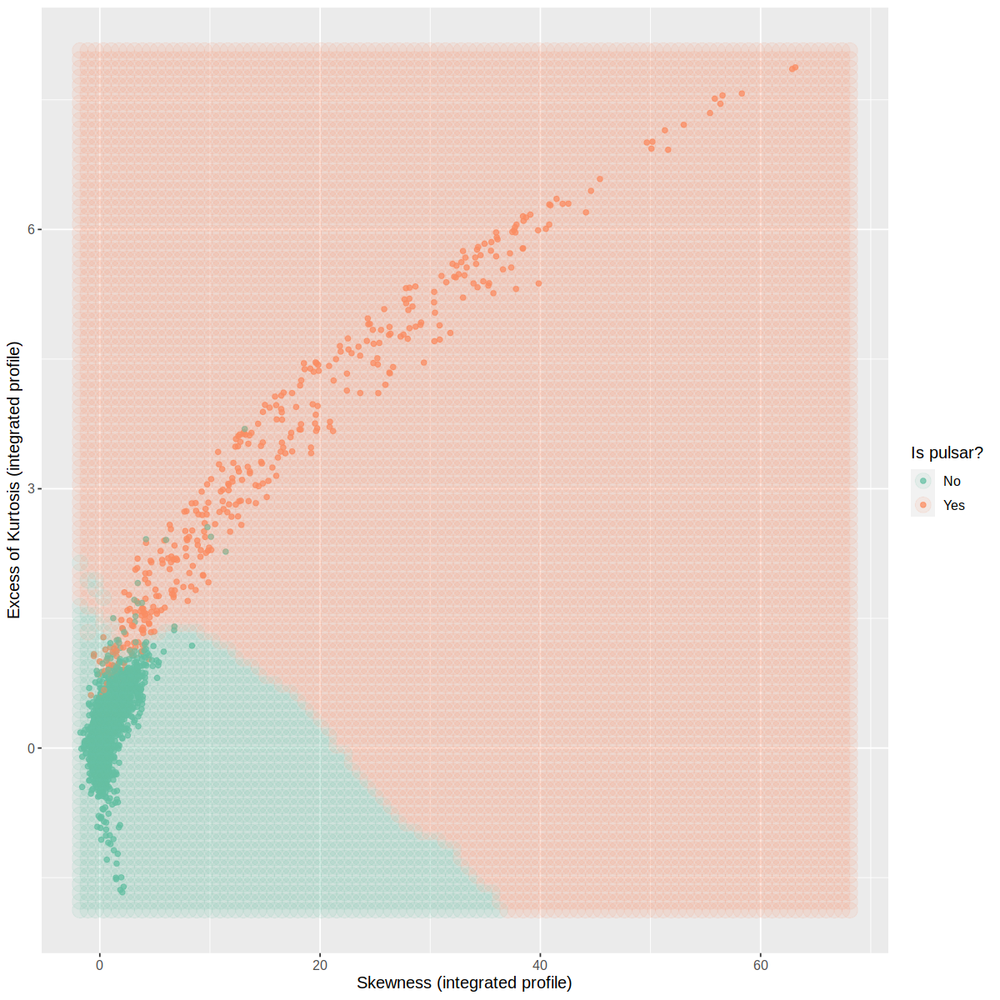

In [17]:
#### 
#GRAPH
# REWRITE: create the grid of area/smoothness vals, and arrange in a data frame
skew_grid <- seq(min(star_data$skew_ip), 
                max(star_data$skew_ip), 
                length.out = 100)
kurtosis_grid <- seq(min(star_data$kurtosis_ip), 
                max(star_data$kurtosis_ip), 
                length.out = 100)
asgrid <- as_tibble(expand.grid(skew_ip = skew_grid, 
                                kurtosis_ip = kurtosis_grid))

# REWRITE: use the fit workflow to make predictions at the grid points
knnPredGrid <- predict(knn_fit, asgrid)

# bind the predictions as a new column with the grid points
prediction_table <- bind_cols(knnPredGrid, asgrid) |> 
  rename(pulsar = .pred_class)

# REWRITE plot:
# 1. the colored scatter of the original data
# 2. the faded colored scatter for the grid points
workflow_plot <-
  ggplot() +
  geom_point(data = star_test, 
             mapping = aes(x = skew_ip, 
                           y = kurtosis_ip, 
                           color = pulsar), 
             alpha = 0.75) +
  geom_point(data = prediction_table, 
             mapping = aes(x = skew_ip, 
                           y = kurtosis_ip, 
                           color = pulsar), 
             alpha = 0.1, 
             size = 5) +
  labs(y = "Excess of Kurtosis (integrated profile)", x = "Skewness (integrated profile)", color = "Is pulsar?") + 
  scale_color_brewer(palette = "Set2") +
  theme(text = element_text(size = 12))



workflow_plot

In [18]:
# LEGEND